# imports

In [7]:
import pandas as pd
import numpy as np
import os
import datetime
from tqdm import tqdm

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import pearsonr, spearmanr

from nltk.sentiment import SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, f1_score, accuracy_score,classification_report, recall_score, precision_score
# ROC curve
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.inspection import permutation_importance
import xgboost as xgb

# Data

In [8]:
p = '/home/pelle/Master_Thesis/data/raw/wallstreetbets/'
df_post = pd.read_csv(p+'submissions_pmaw_2016-2021_wsb.csv',usecols=['author','created_utc','score','num_comments','title','selftext','id','award_count'])
df_post = df_post[df_post['author'] != '[deleted]']
len1=len(df_post.loc[df_post['award_count'] > 0])
len2=len(df_post.loc[df_post['award_count'] == 0])

In [9]:
p = '/home/pelle/Master_Thesis/data/raw/wallstreetbets/network_features/'
file_names=os.listdir(p)

data = []

for name in file_names:
    data.append(pd.read_csv(p+name))

df_gf=pd.concat(data)

df_balanced = pd.read_csv('/home/pelle/Master_Thesis/data/raw/wallstreetbets/balanced_data_chunked10.csv')

In [10]:
df_gf.drop_duplicates(inplace=True)
df=df_balanced.join(df_gf.set_index('id'),on='id')
df.dropna(subset='degree',inplace=True)
df=df[['author', 'date', 'score', 'n_comments', 'id',
       'n_awards', 'text_title', 'degree_cen',
       	'close_cen','activity',	'degree','N_nodes',
        'N_edges','mentions','frac_rec',	
        'degree_in','degree_out','N_rec_author','N_rec']]

df.loc[df.n_awards==0,'awarded']=0
df.loc[df.n_awards!=0,'awarded']=1

df['n_comments']=df.n_comments.apply(lambda x: np.sqrt(x**2))

df['date'] = pd.to_datetime(df['date'])

In [11]:
def get_sentiment(text):
    if type(text) == str:
        com = sia.polarity_scores(text)['compound']
        return com
    else:
        return np.nan

def text_length(text):
    if type(text) == str:
        return len(text)
    else:
        return np.nan

df['sentiment_compound']=df['text_title'].apply(lambda x: get_sentiment(x))
df['text_length']=df['text_title'].apply(lambda x: text_length(x))

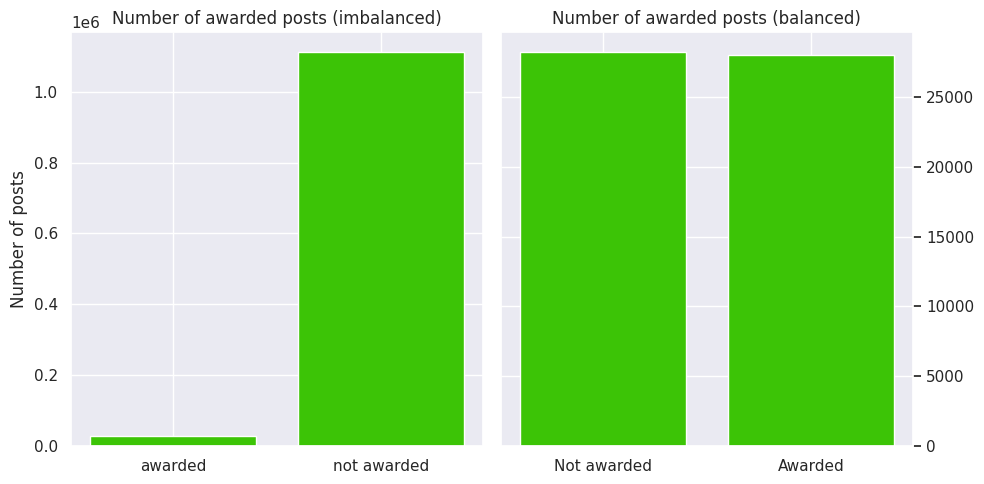

In [12]:
# subplots
fig, ax = plt.subplots(1,2,figsize=(10,5))
ax[0].bar(['awarded','not awarded'],[len1,len2],color='#3cc406')
ax[0].set_title('Number of awarded posts (imbalanced)')
ax[0].set_ylabel('Number of posts')
ax[1].bar(['Not awarded','Awarded'],df.awarded.value_counts(),color='#3cc406')
ax[1].set_title('Number of awarded posts (balanced)')
# ax[1].set_ylabel('Number of posts')
# set y axis on the right
ax[1].yaxis.tick_right()
plt.tight_layout()
plt.show()

In [7]:
len(df)

56278

In [8]:
df = df.sample(frac = 1)

# Analysis

In [13]:
df_no = df.loc[df.degree!=0]

### Temporal

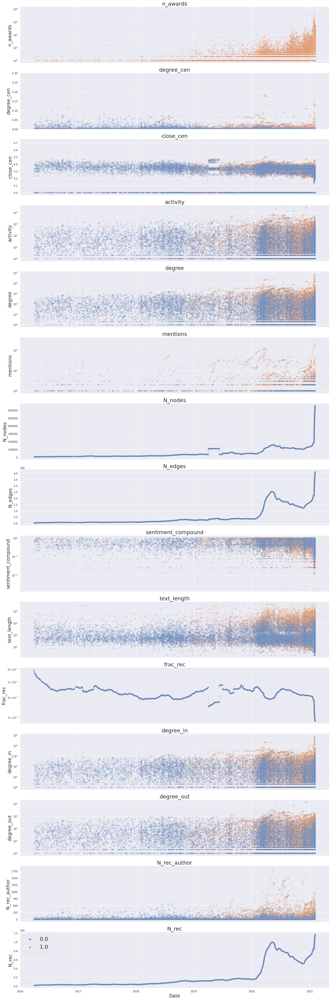

In [21]:
# subplots share x
features =['n_awards','degree_cen', 'close_cen', 'activity', 'degree', 'mentions', 
            'N_nodes', 'N_edges','sentiment_compound','text_length','frac_rec','degree_in','degree_out','N_rec_author','N_rec']

log_scale = ['n_awards','activity', 'degree', 'mentions', 'sentiment_compound','text_length','frac_rec','degree_in','degree_out']

fig, axs = plt.subplots(len(features), 1, figsize=(20,4*len(features)), sharex=True)


for val in features:
    sns.scatterplot(data=df, x='date', y=val, hue='awarded', ax=axs[features.index(val)], alpha=0.2,s=40)
    axs[features.index(val)].set_title(val, fontsize=23)
    axs[features.index(val)].set_ylabel(val, fontsize=20)
    axs[features.index(val)].set_xlabel('Date', fontsize=20)
    # legend false
    axs[features.index(val)].get_legend().remove()

    if val == 'degree_cen':
        axs[features.index(val)].set_ylim(0,0.3)
    
    if val in log_scale:
        axs[features.index(val)].set_yscale('log')


plt.legend(fontsize=23)
plt.tight_layout()
plt.show()

In [50]:
# rho = df.corr()
# pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
# p = pval.applymap(lambda x: ''.join(['*' for t in [0.05] if x<=t]))

# fig, ax = plt.subplots(figsize=(13,13))

# sns.heatmap(data=rho, annot=(np.array(rho.round(2).astype(str) + p)),fmt = '',vmin=-1,vmax=1,cmap='coolwarm')

# # rotate xticks
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right',fontsize=12)
# ax.set_yticklabels(ax.get_yticklabels(),fontsize=12)
# plt.savefig('correlation_matrix.png',dpi=300)
# plt.show()'

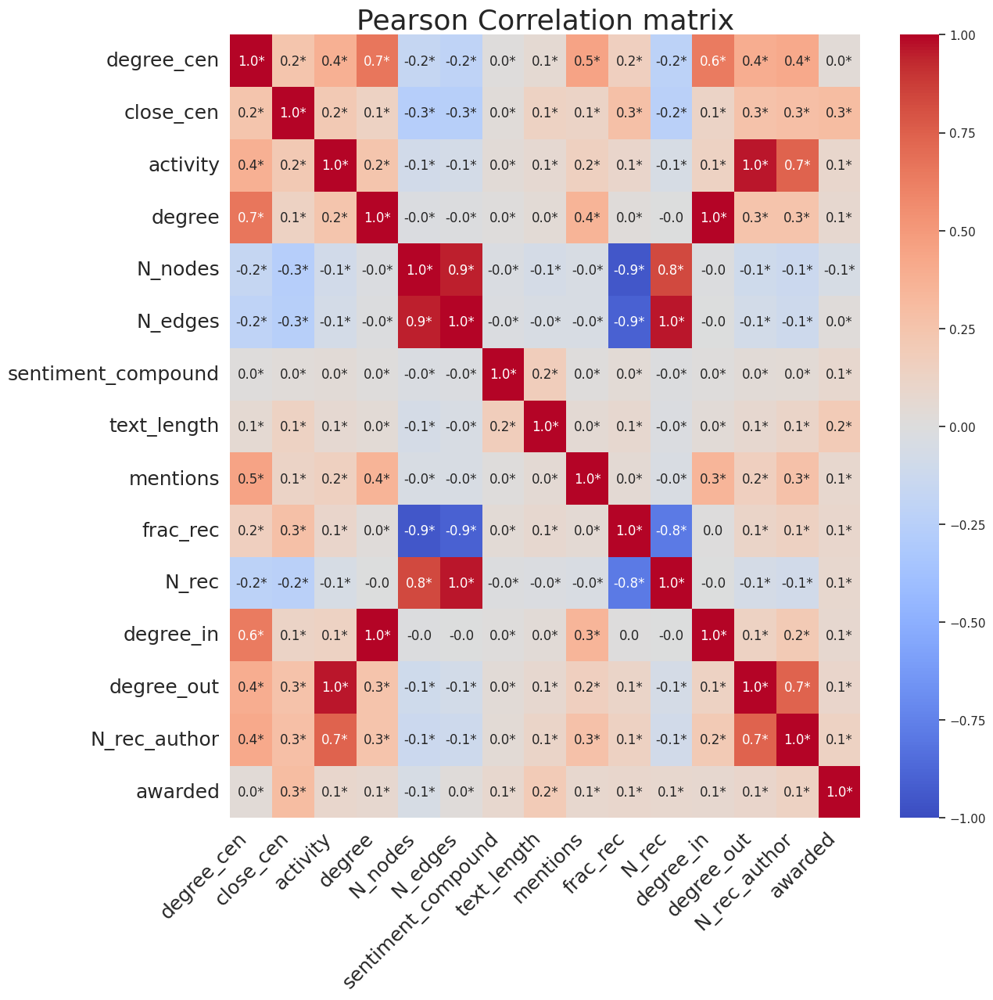

In [20]:
features = ['degree_cen', 'close_cen', 'activity', 'degree', 'N_nodes', 'N_edges', 'sentiment_compound', 
            'text_length','mentions','frac_rec','N_rec','degree_in','degree_out','N_rec_author','awarded']
df_t = df[features]
rho = df_t.corr()
pval = df_t.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.05] if x<=t]))

fig, ax = plt.subplots(figsize=(13,13))

sns.heatmap(data=rho, annot=(np.array(rho.round(1).astype(str) + p)),fmt = '',vmin=-1,vmax=1,cmap='coolwarm')

# rotate xticks
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right',fontsize=18)
ax.set_yticklabels(ax.get_yticklabels(),fontsize=18)
plt.title('Pearson Correlation matrix',fontsize=26)
plt.show()

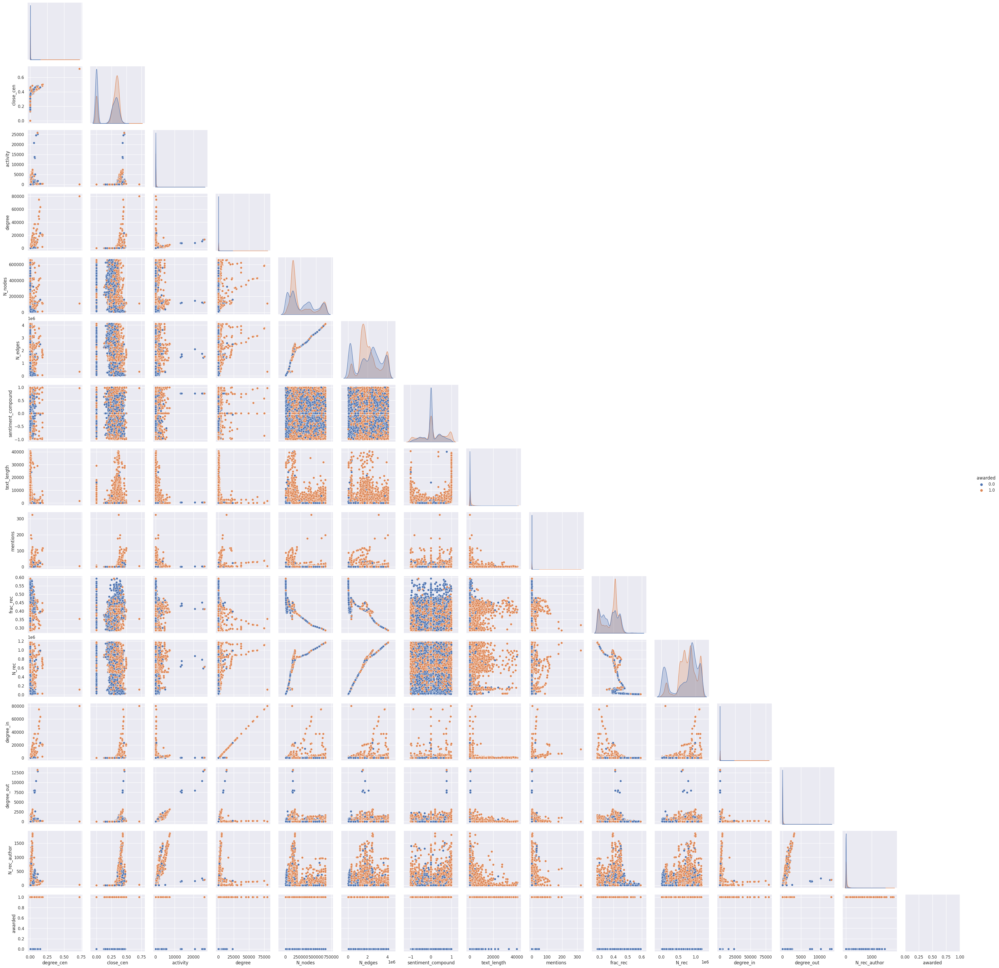

In [51]:
sns.pairplot(df, hue='awarded', vars=['degree_cen', 'close_cen', 'activity', 'degree', 'N_nodes', 'N_edges', 'sentiment_compound', 
            'text_length','mentions','frac_rec','N_rec','degree_in','degree_out','N_rec_author','awarded'],corner=True)

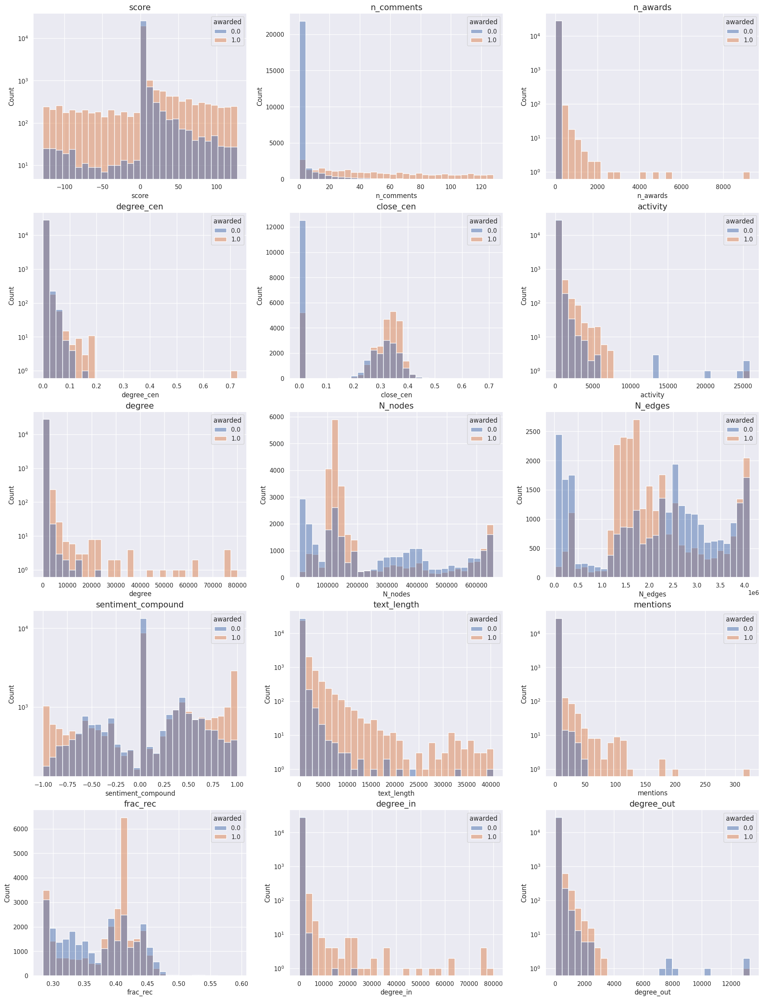

In [13]:
features = ['score', 'n_comments',  'n_awards', 'degree_cen', 'close_cen', 'activity', 'degree', 
            'N_nodes', 'N_edges', 'sentiment_compound', 'text_length', 
            'mentions','frac_rec','degree_in','degree_out']
            
log_features = ['score','n_awards', 'degree_cen', 'activity','degree','text_length','mentions','degree_in','degree_out','sentiment_compound']

fig, axs = plt.subplots(5, 3, figsize=(8*3,8*4))
axs = axs.flatten()

for i in range(len(features)):
    f = features[i]
    if f in log_features:
        sns.histplot(data=df, x=f, hue='awarded', ax=axs[i],bins=30)
        axs[i].set_yscale('log')
    else:
        sns.histplot(data=df, x=f, hue='awarded', ax=axs[i],bins=30)
    axs[i].set_title(f,fontsize=15)

plt.show()

## Rich get richer

In [14]:
top10=df.loc[df['n_awards']>0].groupby('author').agg({'n_awards':'sum'}).sort_values(by='n_awards',ascending=False).head(10)
top10

,n_awards
author,
DeepFuckingValue,19411.0
Youkiame,5279.0
SomeGuyInDeutschland,4224.0
OPINION_IS_UNPOPULAR,3766.0
ssauronn,2977.0
Lunar033,2976.0
wallstreetboyfriend,2660.0
IDoLikeMyShishkebabs,2654.0
shhaayy,2053.0


In [15]:
df.loc[df.author.isin(top10.index)].groupby('author').count()['id'].sort_values(ascending=False)

author
dhiral1994              55
DeepFuckingValue        44
OPINION_IS_UNPOPULAR    34
IDoLikeMyShishkebabs    21
wallstreetboyfriend      8
Youkiame                 5
ssauronn                 4
Lunar033                 3
shhaayy                  3
SomeGuyInDeutschland     2
Name: id, dtype: int64

/tmp/ipykernel_5205/1710050113.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top10_df['N_awards_relative']=(top10_df['n_awards'] / top10_df['N_nodes'])


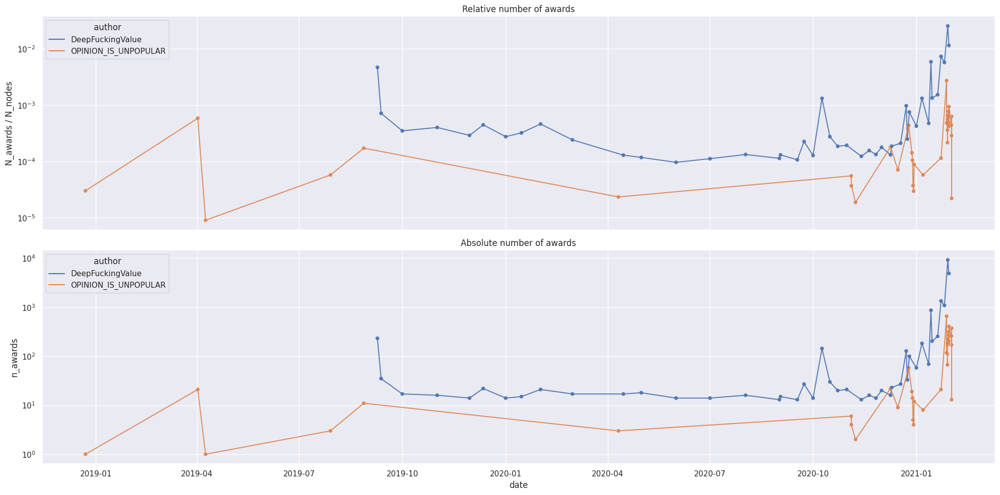

In [16]:
top10_df=df.loc[df['author'].isin(['DeepFuckingValue','OPINION_IS_UNPOPULAR'])]
top10_df['N_awards_relative']=(top10_df['n_awards'] / top10_df['N_nodes'])
# 2 suplots
fig, axs = plt.subplots(2, 1, figsize=(20,10), sharex=True)
axs.flatten()
sns.lineplot(data=top10_df, y='N_awards_relative', x='date', hue='author', ax=axs[0],alpha=0.9)
sns.scatterplot(data=top10_df, y='N_awards_relative', x='date', hue='author', ax=axs[0],color='black',alpha=0.9,legend=False)
axs[0].set_ylabel('N_awards / N_nodes')
axs[0].set_title('Relative number of awards')
axs[0].set_yscale('log')

sns.lineplot(data=top10_df, y='n_awards', x='date', hue='author', ax=axs[1],alpha=0.9)
sns.scatterplot(data=top10_df, y='n_awards', x='date', hue='author', ax=axs[1],color='black',alpha=0.9,legend=False)
axs[1].set_title('Absolute number of awards')
axs[1].set_yscale('log')
plt.tight_layout()
plt.show()

# PCA

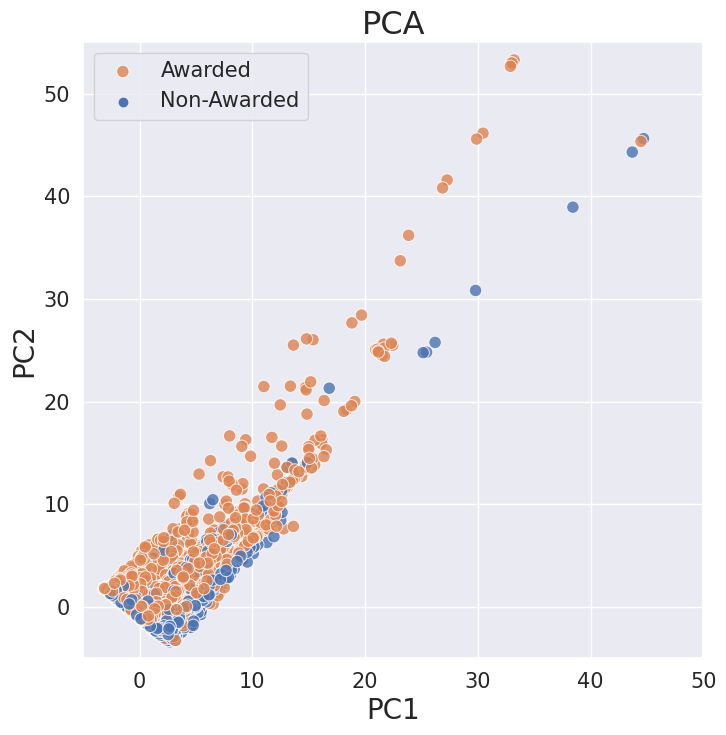

In [68]:
# pca
features = ['degree_cen', 'close_cen', 'activity', 'degree', 'N_nodes', 'N_edges', 'sentiment_compound', 
            'text_length','mentions','frac_rec','N_rec','degree_in','degree_out','N_rec_author']

scaler = StandardScaler()
scaler.fit(df[features])
df_scaled = scaler.transform(df[features])

pca = PCA(n_components=2)
pca.fit(df_scaled)
df_pca = pca.transform(df_scaled)

df_pca = pd.DataFrame(df_pca,columns=['PC1','PC2'])
df_pca['awarded'] = df['awarded'].values
plt.figure(figsize=(8,8))
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='awarded',alpha=0.8,s=80)
plt.title('PCA',fontsize=23)
plt.xlabel('PC1',fontsize=20)
plt.ylabel('PC2',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylim(-5,55)
plt.xlim(-5,50)
plt.legend(labels=['Awarded','Non-Awarded'],fontsize=15)
plt.show()

# Random Forrest

In [4]:
features = ['degree_cen', 'close_cen', 'activity', 'degree', 'N_nodes', 'N_edges', 'sentiment_compound', 
            'text_length','mentions','frac_rec','N_rec','degree_in','degree_out','N_rec_author']

# # split data into train and test sets
# train, test = train_test_split(df, test_size=0.2, random_state=42)
# test, val = train_test_split(test, test_size=0.5, random_state=42)

val  =pd.read_csv('/home/pelle/Master_Thesis/data/processed/splitted/eval_full.csv')
test =pd.read_csv('/home/pelle/Master_Thesis/data/processed/splitted/test_full.csv')
train=pd.read_csv('/home/pelle/Master_Thesis/data/processed/splitted/train_full.csv')

# split data into X and y
X_train = train[features]
y_train = train['awarded']
X_test = test[features]
y_test = test['awarded']
X_val = val[features]
y_val = val['awarded']

In [75]:
L = len(X_train)+len(X_test)+len(X_val)
print('Train: {:.2f}%'.format(len(X_train)/L*100))
print('Test: {:.2f}%'.format(len(X_test)/L*100))
print('Validation: {:.2f}%'.format(len(X_val)/L*100))

Train: 80.00%
Test: 10.00%
Validation: 10.00%


In [82]:
# create model
rf = RandomForestClassifier(n_estimators=100, random_state=42)

# fit model
rf.fit(X_train, y_train)

# predict
y_pred = rf.predict(X_test)

classif_report = classification_report(y_test, y_pred,digits=4)
print(classif_report)
print('F1 score: ', f1_score(y_test, y_pred))
print('Accuracy: ', accuracy_score(y_test, y_pred))
print('Recall: ', recall_score(y_test, y_pred))
print('Precision: ', precision_score(y_test, y_pred))

# predict probabilities
lr_probs = rf.predict_proba(X_test)
# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
# calculate scores
lr_auc = roc_auc_score(y_test, lr_probs)
# summarize scores
print('RF: ROC AUC=%.3f' % (lr_auc))

# permutation importance
result = permutation_importance(rf, X_test, y_test,
                            n_repeats=30,
                            random_state=0,
                            scoring='f1')

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X_test.columns[sorted_importances_idx])

              precision    recall  f1-score   support

           0     0.7594    0.7306    0.7447      2829
           1     0.7378    0.7660    0.7516      2799

    accuracy                         0.7482      5628
   macro avg     0.7486    0.7483    0.7482      5628
weighted avg     0.7486    0.7482    0.7482      5628

F1 score:  0.7516213847502192
Accuracy:  0.748223169864961
Recall:  0.765987852804573
Precision:  0.7377838953888507
RF: ROC AUC=0.833


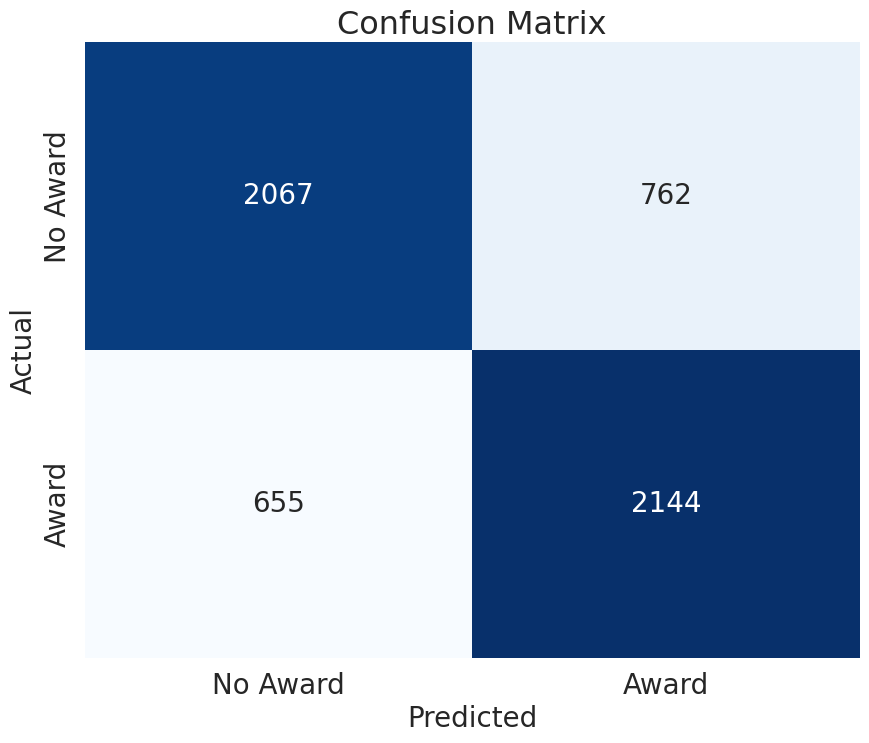

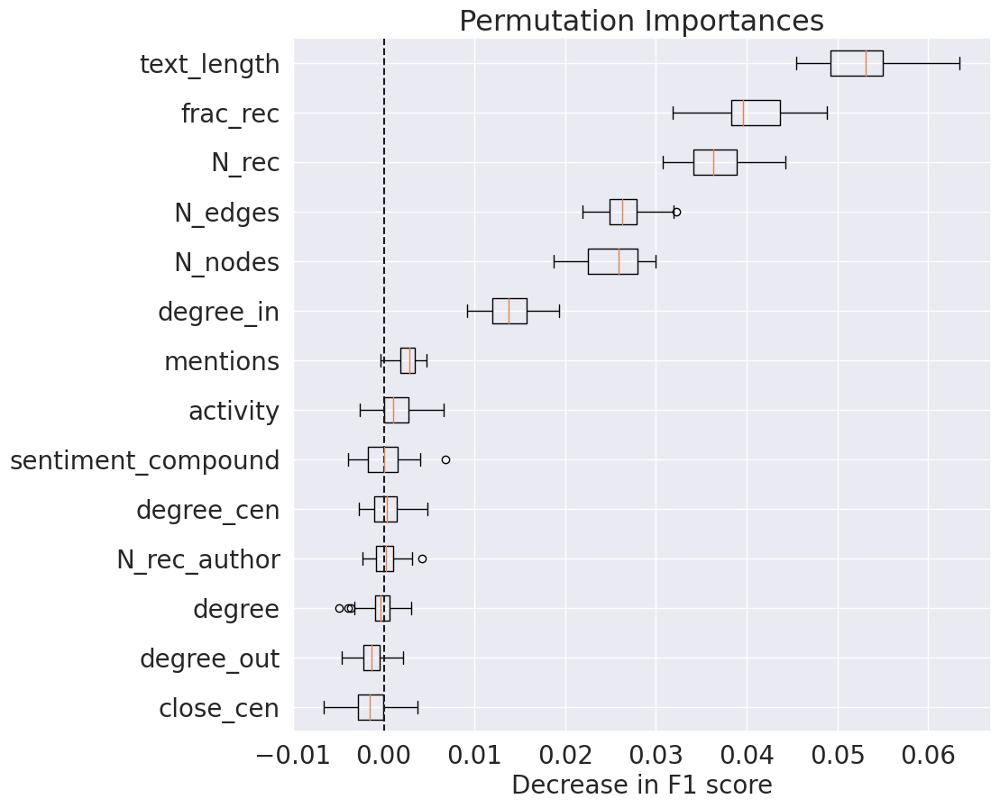

In [22]:
# Confusion Matrix
plt.figure(figsize=(10,8))
cm = confusion_matrix(y_test, y_pred.round())
sns.heatmap(cm, annot=True, fmt='d',cmap='Blues', cbar=False, annot_kws={"size": 20})
plt.xticks([0.5,1.5], ['No Award', 'Award'], fontsize=20)
plt.yticks([0.5,1.5], ['No Award', 'Award'],fontsize=20)
plt.xlabel('Predicted', fontsize=20)
plt.ylabel('Actual', fontsize=20)
plt.title('Confusion Matrix', fontsize=23)
plt.show()

# plt.figure(figsize=(8,8))
# importance = rf.feature_importances_
# idx = np.argsort(importance)
# plt.barh([x for x in X_train.columns[idx]], importance[idx])
# plt.tick_params(axis='x', labelrotation = 0)
# plt.title('Feature Importance (gini)', fontsize=16)
# plt.show()

# plot permutation importance
plt.figure(figsize=(10,10))
plt.boxplot(importances, vert=False, labels=importances.columns)
plt.tick_params(axis='x', labelsize=20)
plt.tick_params(axis='y', labelsize=20)
plt.title("Permutation Importances", fontsize=23)
plt.axvline(x=0, color="k", linestyle="--")
plt.xlabel("Decrease in F1 score",  fontsize=20)
plt.show()

In [77]:
# create model
rf = RandomForestClassifier(n_estimators=100, random_state=42)

# fit model
rf.fit(X_train, y_train)

# predict
L=len(X_test)
X1=X_test[:int(L/8)]
X2=X_test[int(L/8):int(L/4)]
X3=X_test[int(L/4):int(L/2)]
X4=X_test[int(L/2):int(L*3/4)]
X5=X_test[int(L*3/4):int(L*7/8)]
X6=X_test[int(L*7/8):]

y1=y_test[:int(L/8)]
y2=y_test[int(L/8):int(L/4)]
y3=y_test[int(L/4):int(L/2)]
y4=y_test[int(L/2):int(L*3/4)]
y5=y_test[int(L*3/4):int(L*7/8)]
y6=y_test[int(L*7/8):]

f1s= []
for y_t,X_t in zip([y1,y2,y3,y4,y5,y6],[X1,X2,X3,X4,X5,X6]):
    # predict
    y_pred = rf.predict(X_t)
    f1s.append(f1_score(y_t, y_pred))


In [81]:
print(np.mean(f1s))
print(np.std(f1s))

0.7524897256710591
0.011222536365554765


## Temporal Feature importance

/tmp/ipykernel_5205/589598894.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  awarded.sort_values(by='date', inplace=True)


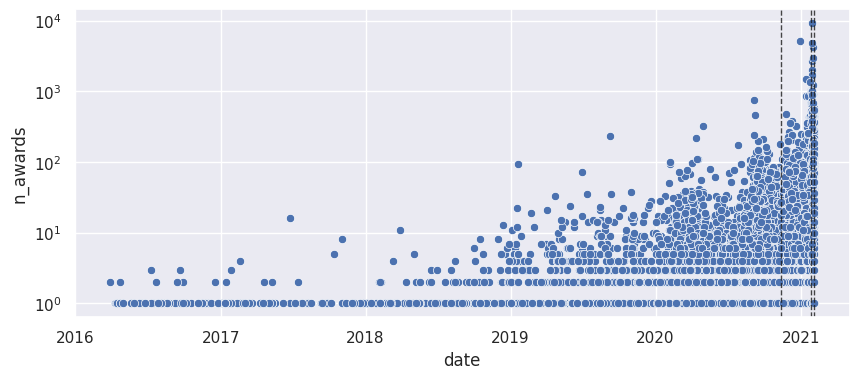

In [23]:
# divide df into 2 samples with same number of awarded and not awarded posts but with different time periods
N = 3
awarded = df[df.awarded==1]
awarded.sort_values(by='date', inplace=True)
l=len(awarded)
periode = l//N

awarded_periods = []
for i in range(N):
    awarded_periods.append(awarded.iloc[i*periode:(i+1)*periode])

plt.figure(figsize=(10,4))
sns.scatterplot(data=df, x='date', y='n_awards')
# insert vertical lines to show the split
for i in range(N):
    plt.axvline(x=awarded_periods[i].date.max(), color='k', linestyle='--', alpha=0.8, linewidth=1)
plt.yscale('log')
plt.show()

In [24]:
not_awarded = df[df.awarded==0]

df_periods = []
for i in range(N):
    max_d = awarded_periods[i].date.max()
    min_d = awarded_periods[i].date.min()
    not_awarded_period = not_awarded[(not_awarded.date>min_d) & (not_awarded.date<max_d)]
    try:
        df_periods.append(pd.concat([awarded_periods[i], not_awarded_period.sample(n=len(awarded_periods[i]))]))
    except:
        df_periods.append(pd.concat([awarded_periods[i].sample(len(not_awarded_period)), not_awarded_period]))

In [25]:
from sklearn.utils import resample
features = ['degree_cen', 'close_cen', 'activity', 'degree', 'N_nodes', 'N_edges', 'sentiment_compound', 
            'text_length','mentions','frac_rec','N_rec','degree_in','degree_out','N_rec_author']


f1s = []
accuracies = []
imp = []
dfs = []
data_size = []
class_size = []


for i in tqdm(range(N)):
    df_temp = df_periods[i]
    # split data into X and y
    train, test = train_test_split(df_temp, test_size=0.2, random_state=42)
    test, val = train_test_split(test, test_size=0.5, random_state=42)

    # split data into X and y
    X_train = train[features]
    y_train = train['awarded']
    X_test = test[features]
    y_test = test['awarded']
    X_val = val[features]
    y_val = val['awarded']

    # normalize train data
    scaler = StandardScaler()
    scaler.fit(df[features])
    X_train_norm = scaler.transform(X_train)
    X_test_norm = scaler.transform(X_test)
    X_val_norm = scaler.transform(X_val)
    
    # create model
    rf = RandomForestClassifier(n_estimators=100, random_state=42)

    # fit model
    rf.fit(X_train_norm, y_train)

    # predict
    y_pred = rf.predict(X_test_norm)
    f1 = f1_score(y_test, y_pred.round())
    accuracy = accuracy_score(y_test, y_pred.round())


    result = permutation_importance(rf, X_test_norm, y_test,
                        n_repeats=30,
                        random_state=0,
                        scoring='f1')

    sorted_importances_idx = result.importances_mean.argsort()
    permutation_importance_df = pd.DataFrame(
        result.importances[sorted_importances_idx].T,
        columns=X_test.columns[sorted_importances_idx])
    
    permutation_importance_df['start_date'] = df_temp.date.min()

    data_size.append(len(df_temp))
    class_size.append(len(df_temp[df_temp['awarded']==1]))
    f1s.append(f1)
    accuracies.append(accuracy)
    dfs.append(df_temp)
    imp.append(permutation_importance_df)

100%|██████████| 3/3 [00:36<00:00, 12.18s/it]


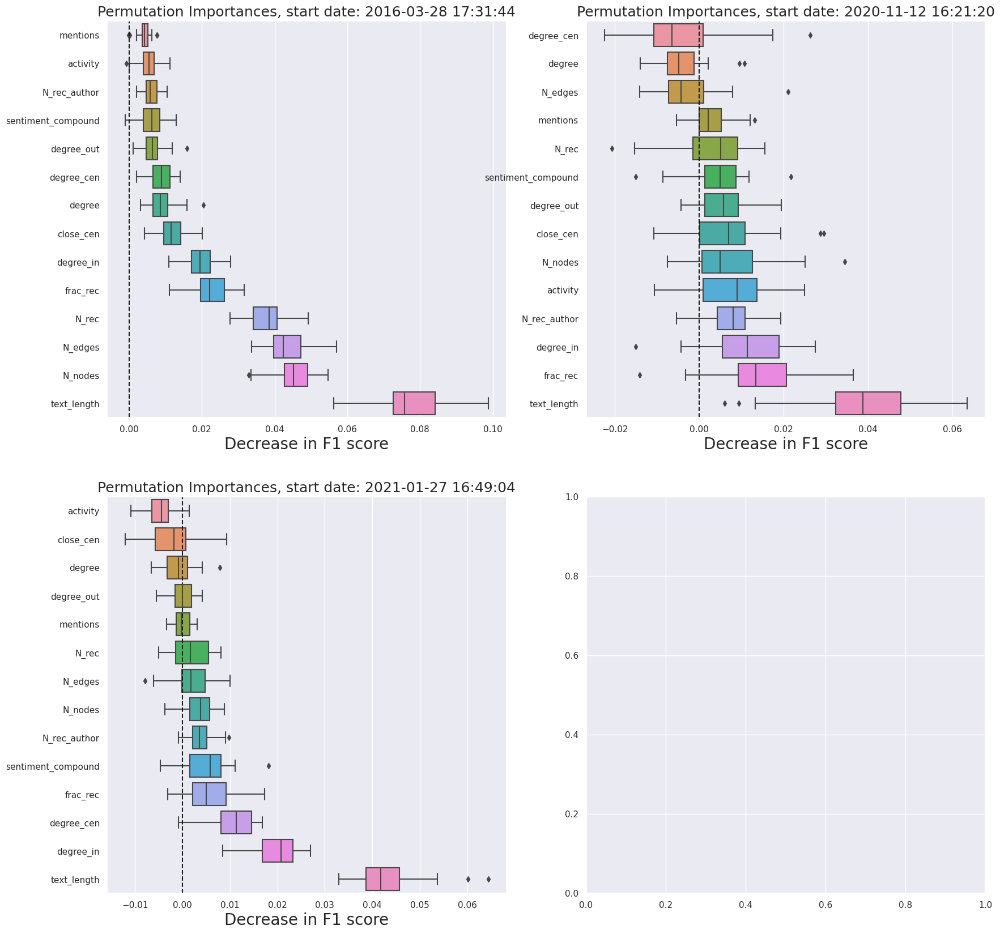

In [26]:
# supplot permutation importance
fig, axs = plt.subplots(2, 2, figsize=(20,20))
axs = axs.flatten()
for i in range(N):
    sns.boxplot(data=imp[i], orient='h', ax=axs[i])
    axs[i].axvline(x=0, color="k", linestyle="--")
    axs[i].set_xlabel("Decrease in F1 score",  fontsize=20)
    axs[i].set_title(f"Permutation Importances, start date: {imp[i].start_date.iloc[0]}", fontsize=18)

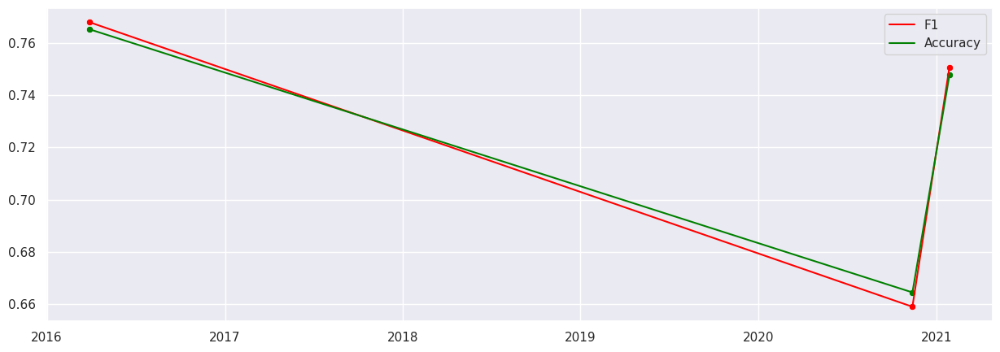

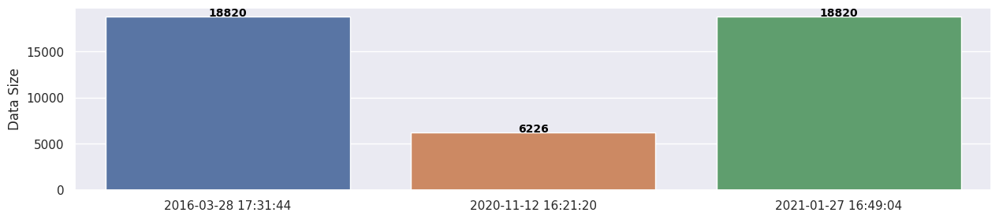

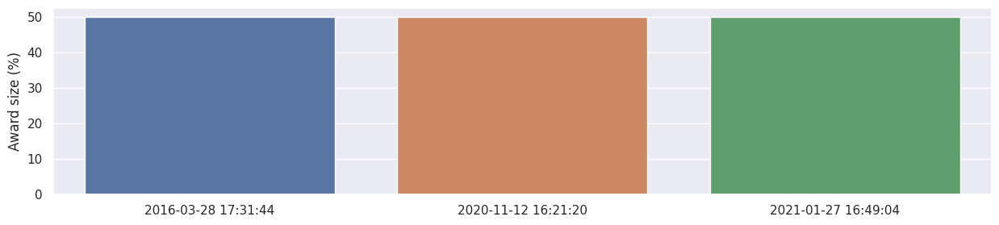

In [27]:
start_dates = [x.start_date.iloc[0] for x in imp]
plt.figure(figsize=(15,5))
sns.scatterplot(x=start_dates, y=f1s, color='red')
sns.lineplot(x=start_dates, y=f1s, color='red', label='F1')
sns.scatterplot(x=start_dates, y=accuracies, color='green')
sns.lineplot(x=start_dates, y=accuracies, color='green', label='Accuracy')
plt.show()

plt.figure(figsize=(15,3))
sns.barplot(x=start_dates, y=data_size)
# insert text
for i in range(len(data_size)):
    plt.text(i, data_size[i]+0.1, data_size[i], horizontalalignment='center', size='small', color='black', weight='semibold')
plt.ylabel('Data Size')
plt.show()

plt.figure(figsize=(15,3))
sns.barplot(x=start_dates, y=class_size/np.array(data_size)*100)
plt.ylabel('Award size (%)')
plt.show()

# logistic regression

              precision    recall  f1-score   support

         0.0     0.6436    0.9137    0.7552       927
         1.0     0.8587    0.5089    0.6391       955

    accuracy                         0.7083      1882
   macro avg     0.7511    0.7113    0.6971      1882
weighted avg     0.7527    0.7083    0.6963      1882

F1 score:  0.6390532544378698
Accuracy:  0.7082890541976621
Recall:  0.5089005235602094
Precision:  0.8586572438162544
Logistic: ROC AUC=0.786


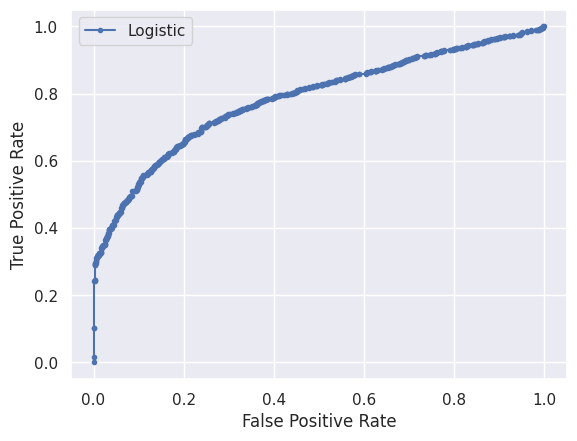

In [28]:
# log regression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, accuracy_score, classification_report, recall_score, precision_score, roc_auc_score

log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)

y_pred = log_reg.predict(X_test)
classif_report = classification_report(y_test, y_pred, digits=4)
print(classif_report)
print('F1 score: ', f1_score(y_test, y_pred))
print('Accuracy: ', accuracy_score(y_test, y_pred))
print('Recall: ', recall_score(y_test, y_pred))
print('Precision: ', precision_score(y_test, y_pred))

# predict probabilities
lr_probs = log_reg.predict_proba(X_test)
# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
# calculate scores
lr_auc = roc_auc_score(y_test, lr_probs)
# summarize scores
print('Logistic: ROC AUC=%.3f' % (lr_auc))
# calculate roc curves
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)
# plot the roc curve for the model
plt.plot(lr_fpr, lr_tpr, marker='.', label='Logistic')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

# K-nearest

In [5]:
# KNN
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

y_pred = knn.predict(X_test)
classif_report = classification_report(y_test, y_pred, digits=4)
print(classif_report)
print('F1 score: ', f1_score(y_test, y_pred))
print('Accuracy: ', accuracy_score(y_test, y_pred))
print('Recall: ', recall_score(y_test, y_pred))
print('Precision: ', precision_score(y_test, y_pred))

              precision    recall  f1-score   support

           0     0.7119    0.6942    0.7029      2829
           1     0.6985    0.7160    0.7071      2799

    accuracy                         0.7050      5628
   macro avg     0.7052    0.7051    0.7050      5628
weighted avg     0.7052    0.7050    0.7050      5628

F1 score:  0.7071277346506705
Accuracy:  0.7050461975835111
Recall:  0.7159699892818864
Precision:  0.6985012199372603


/home/pelle/anaconda3/envs/py39/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


# Regression model

R2: -0.046652735688053504
RMSE: 42.20972629437456


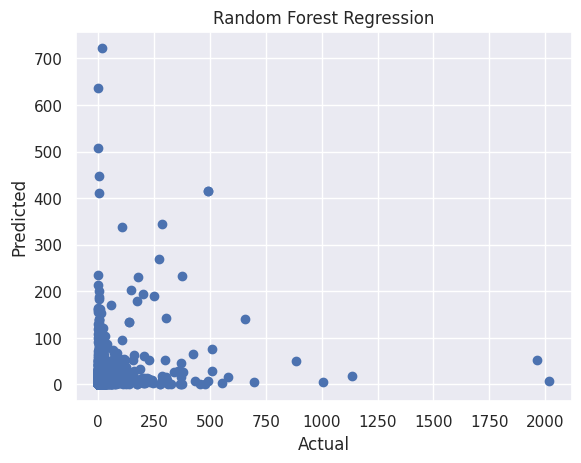

In [29]:
# random forrest regression
from sklearn.ensemble import RandomForestRegressor

features = ['score', 'degree_cen', 'close_cen', 'activity', 'degree', 'N_nodes', 'N_edges', 'sentiment_compound', 'text_length','mentions']

# split data into train and test sets
train, test = train_test_split(df, test_size=0.2)

# split data into X and y
X_train = train[features]
y_train = train['n_awards']
X_test = test[features]
y_test = test['n_awards']

# create model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# predict
y_pred = rf.predict(X_test)

# calculate mean squared error
print('R2: ' + str(r2_score(y_test, y_pred)))
print('RMSE: ' + str(np.sqrt(mean_squared_error(y_test, y_pred))))

#plot 
plt.scatter(x=y_test.values,y=y_pred)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Random Forest Regression')
plt.show()

R2: -0.1313650262791417
RMSE: 62.4848963047894


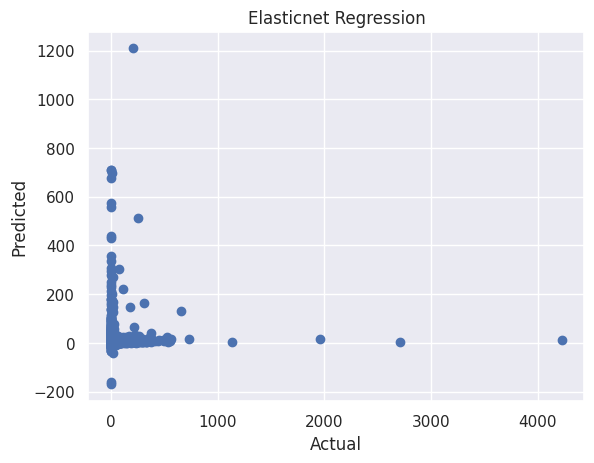

In [30]:
# elastic net regression
from sklearn.linear_model import ElasticNet

features = ['score', 'degree_cen', 'close_cen', 'activity', 'degree', 'N_nodes', 'N_edges', 'sentiment_compound', 'text_length','mentions']

# split data into train and test sets
train, test = train_test_split(df, test_size=0.2)

# split data into X and y
X_train = train[features]
y_train = train['n_awards']
X_test = test[features]
y_test = test['n_awards']

# create model
regr = ElasticNet(random_state=0)
regr.fit(X_train, y_train)

# predict
y_pred = regr.predict(X_test)

# calculate mean squared error
print('R2: ' + str(r2_score(y_test, y_pred)))
print('RMSE: ' + str(np.sqrt(mean_squared_error(y_test, y_pred))))

#plot 
plt.scatter(x=y_test.values,y=y_pred)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Elasticnet Regression')
plt.show()
